In [71]:
import numpy as np
from matplotlib.colors import LogNorm
from scipy import fftpack
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, fft2, ifft2

# 2D FFT

Text(0.5, 1.0, 'Original image')

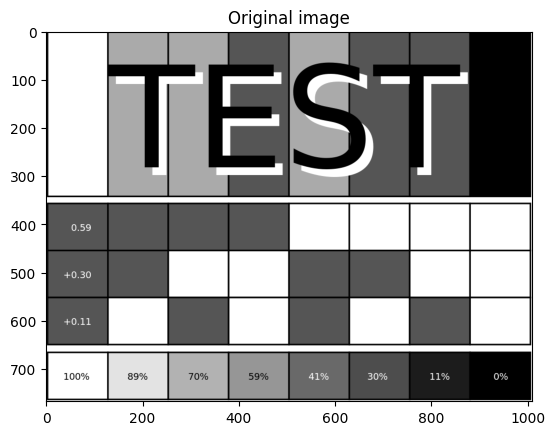

In [41]:
im = plt.imread('test.png').astype(float)
im = np.mean(im, axis=-1)

plt.figure()
plt.imshow(im, plt.cm.gray)
plt.title('Original image')

In [ ]:
1,2,3,4,5
1,2,3,4,5
1,2,3,4,5
1,2,3,4,5

(768, 1009)

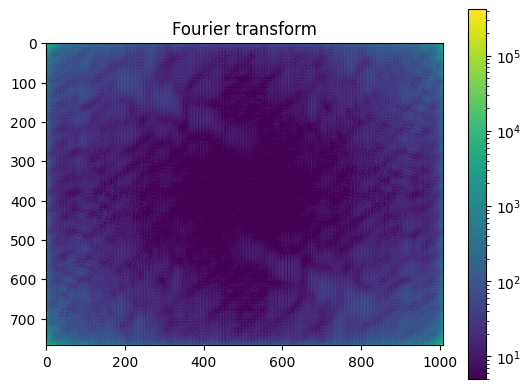

In [49]:
im_fft = fftpack.fft2(im)
im_fft.shape
plt.imshow(np.abs(im_fft), norm=LogNorm(vmin=5))
plt.colorbar()
plt.title('Fourier transform')

im_fft.shape

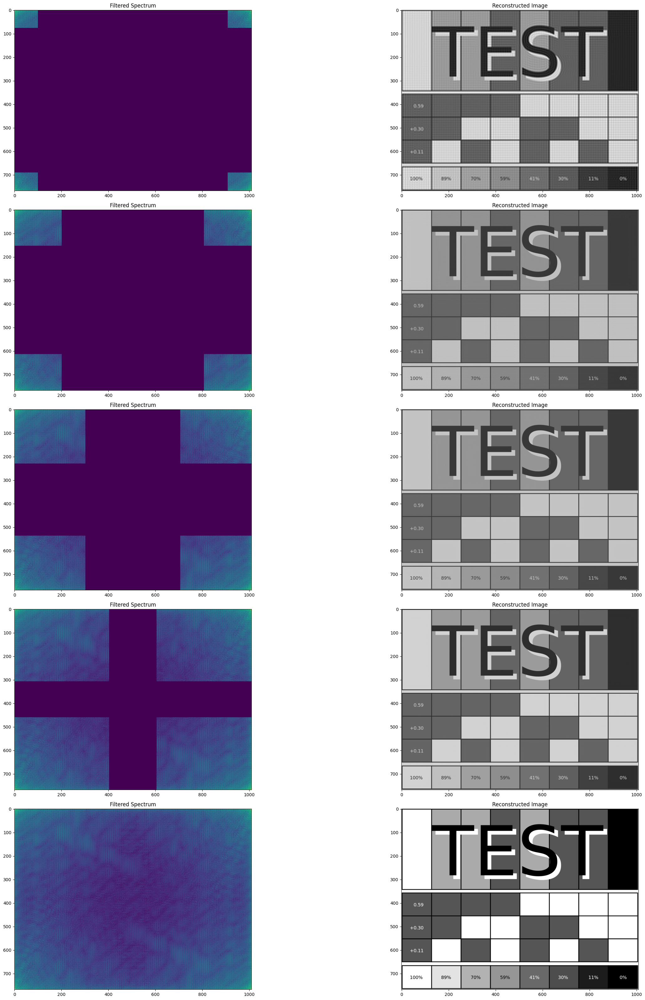

In [85]:

frac_n = 5
fig_size = (32,)*2
fig, ax__ = plt.subplots(frac_n, 2, figsize=fig_size)
for i, keep_fraction in enumerate(np.linspace(0.1, 0.5, frac_n)):
    im_fft2 = im_fft.copy()
    r, c = im_fft2.shape
    im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction)),:] = 0
    im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
    im_new = fftpack.ifft2(im_fft2).real
    
    magnitude = np.log(np.abs(im_fft2) + 1)
    
    ax__[i, 0].imshow(magnitude)
    ax__[i, 0].set_title('Filtered Spectrum')
    ax__[i, 1].imshow(im_new, plt.cm.gray)
    ax__[i, 1].set_title('Reconstructed Image')
plt.subplots_adjust(0,0,1,1,0,0)
plt.tight_layout()

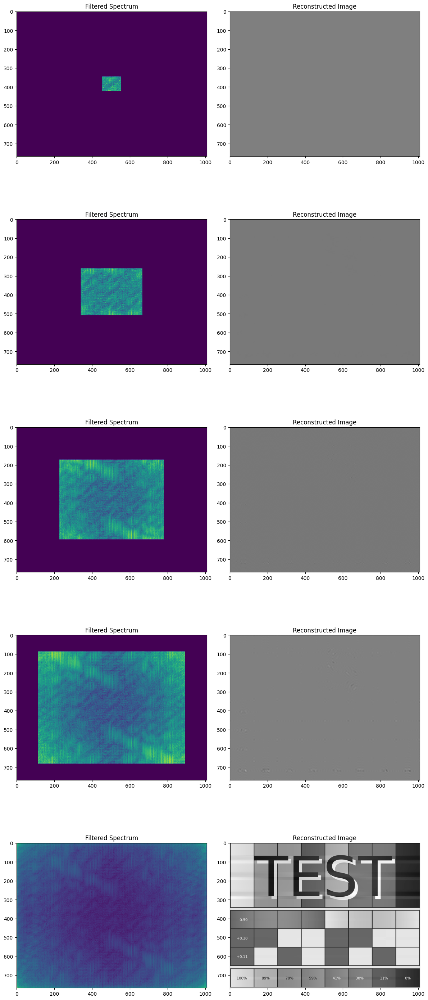

In [94]:
frac_n = 5
fig_scale = 6
fig, ax__ = plt.subplots(frac_n, 2, figsize=(fig_scale*2,fig_scale*frac_n))
for i, keep_fraction in enumerate(np.linspace(0.1, 1, frac_n)):
    im_fft2 = im_fft.copy()
    r, c = im_fft2.shape
    center_r, center_c = int(r/2), int(c/2)
    
    # Calculate the dimensions of the middle square
    square_r = int(r * keep_fraction)
    square_c = int(c * keep_fraction)
    
    # Define the boundaries for the middle square
    r_start = center_r - square_r // 2
    r_end = center_r + square_r // 2
    c_start = center_c - square_c // 2
    c_end = center_c + square_c // 2
    
    # Zero out the portions outside the middle square
    im_fft2[:r_start, :] = 0
    im_fft2[r_end:, :] = 0
    im_fft2[:, :c_start] = 0
    im_fft2[:, c_end:] = 0
    
    im_new = fftpack.ifft2(im_fft2).real

    magnitude = np.log(np.abs(im_fft2) + 1)
    
    ax__[i, 0].imshow(magnitude)
    ax__[i, 0].set_title('Filtered Spectrum')
    ax__[i, 1].imshow(im_new, plt.cm.gray)
    ax__[i, 1].set_title('Reconstructed Image')
plt.subplots_adjust(0,0,1,1,0,0)
plt.tight_layout()


# 2.5D? FFT

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


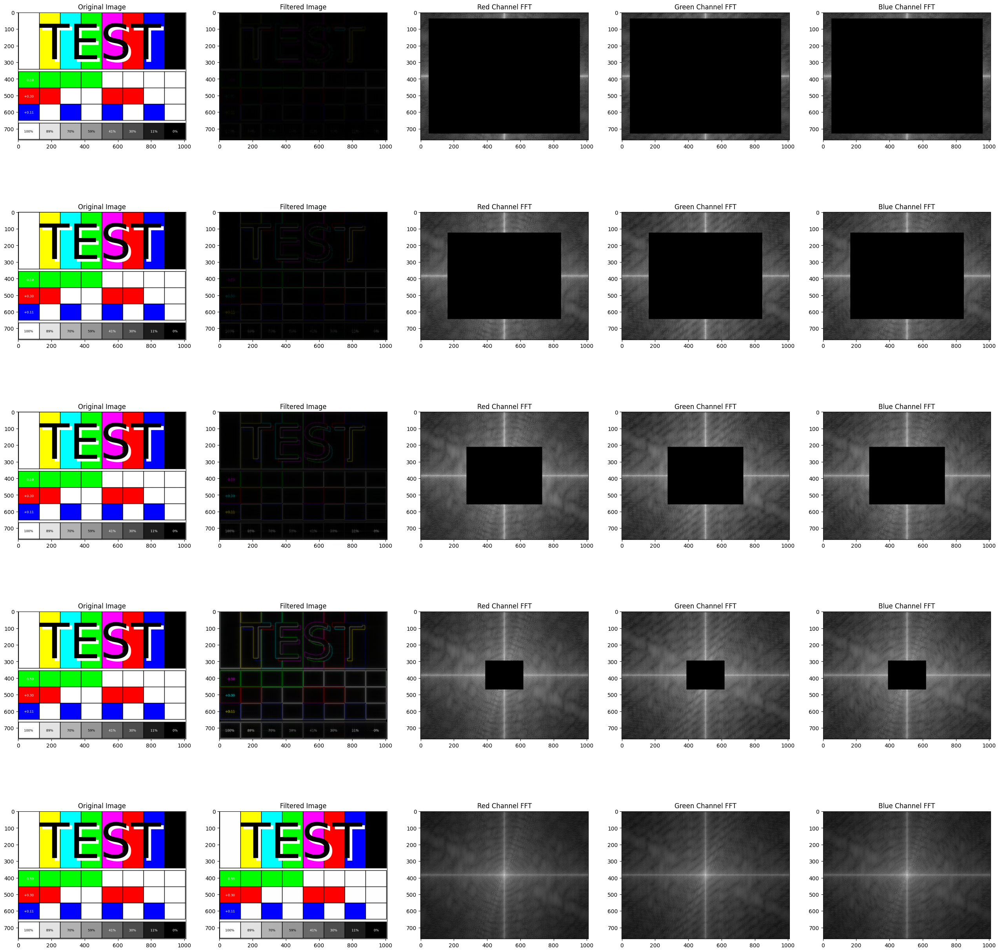

In [89]:
frac_n = 5
fig_size = (32,)*2
fig, ax__ = plt.subplots(frac_n, 5, figsize=fig_size)
image = plt.imread('test.png')

for i, keep_fraction in enumerate(np.linspace(0.1, 1, frac_n)):
    r_channel = image[:, :, 0]
    g_channel = image[:, :, 1]
    b_channel = image[:, :, 2]

    fft_r = fftshift(fft2(r_channel))
    fft_g = fftshift(fft2(g_channel))
    fft_b = fftshift(fft2(b_channel))

    rows, cols = fft_r.shape

    row_cut = int(rows * keep_fraction / 2)
    col_cut = int(cols * keep_fraction / 2)

    fft_r[row_cut:rows - row_cut, col_cut:cols - col_cut] = 0
    fft_g[row_cut:rows - row_cut, col_cut:cols - col_cut] = 0
    fft_b[row_cut:rows - row_cut, col_cut:cols - col_cut] = 0

    filtered_r = np.abs(ifft2(fft_r))
    filtered_g = np.abs(ifft2(fft_g))
    filtered_b = np.abs(ifft2(fft_b))

    filtered_image = np.stack((filtered_r, filtered_g, filtered_b), axis=-1)

    magnitude_r = np.log(np.abs(fft_r) + 1)
    magnitude_g = np.log(np.abs(fft_g) + 1)
    magnitude_b = np.log(np.abs(fft_b) + 1)

    ax__[i,0].imshow(image)
    ax__[i,0].set_title('Original Image')
    ax__[i,1].imshow(filtered_image)
    ax__[i,1].set_title('Filtered Image')
    ax__[i,2].imshow(magnitude_r, cmap='gray')
    ax__[i,2].set_title('Red Channel FFT')
    ax__[i,3].imshow(magnitude_g, cmap='gray')
    ax__[i,3].set_title('Green Channel FFT')
    ax__[i,4].imshow(magnitude_b, cmap='gray')
    ax__[i,4].set_title('Blue Channel FFT')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


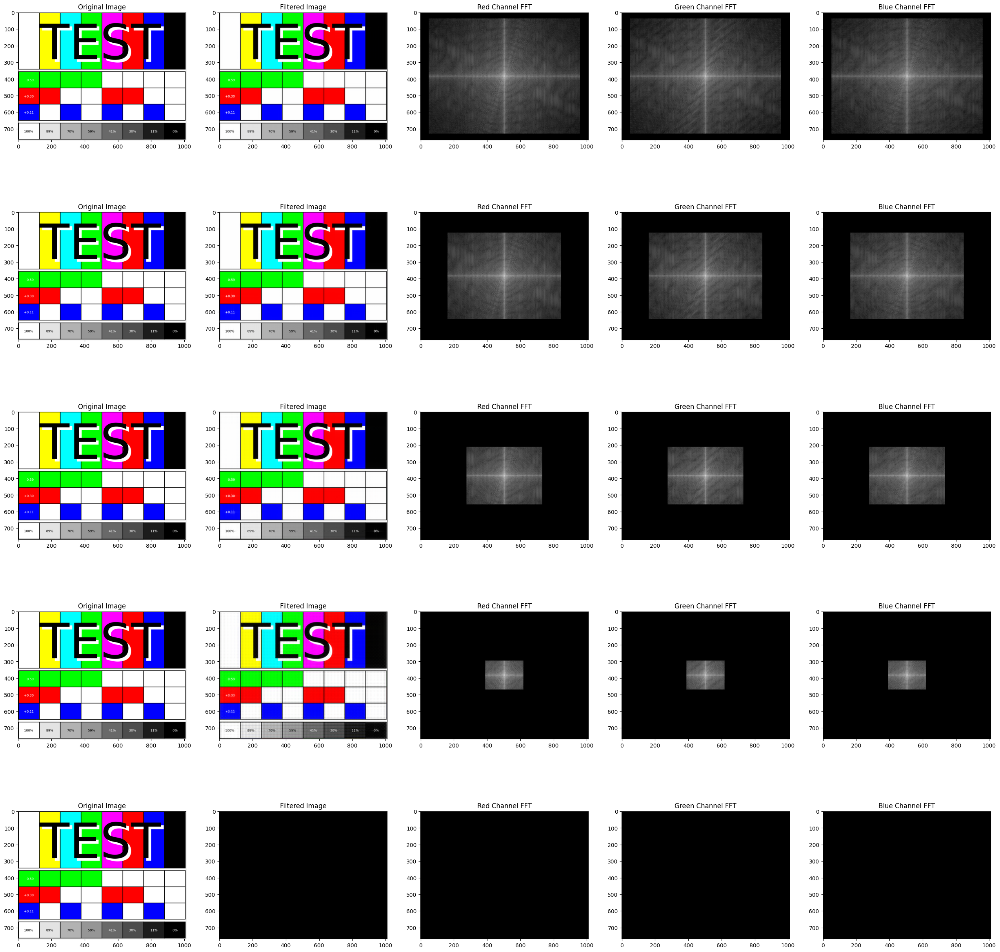

In [88]:
frac_n = 5
fig_size = (32,)*2
fig, ax__ = plt.subplots(frac_n, 5, figsize=fig_size)
image = plt.imread('test.png')

for i, keep_fraction in enumerate(np.linspace(0.1, 1, frac_n)):
    r_channel = image[:, :, 0]
    g_channel = image[:, :, 1]
    b_channel = image[:, :, 2]

    fft_r = fftshift(fft2(r_channel))
    fft_g = fftshift(fft2(g_channel))
    fft_b = fftshift(fft2(b_channel))

    rows, cols = fft_r.shape

    row_cut = int(rows * keep_fraction / 2)
    col_cut = int(cols * keep_fraction / 2)

    # Zero out the outer frequencies, keeping only the middle portion
    fft_r[:row_cut, :] = 0
    fft_r[rows - row_cut:, :] = 0
    fft_r[:, :col_cut] = 0
    fft_r[:, cols - col_cut:] = 0

    fft_g[:row_cut, :] = 0
    fft_g[rows - row_cut:, :] = 0
    fft_g[:, :col_cut] = 0
    fft_g[:, cols - col_cut:] = 0

    fft_b[:row_cut, :] = 0
    fft_b[rows - row_cut:, :] = 0
    fft_b[:, :col_cut] = 0
    fft_b[:, cols - col_cut:] = 0

    filtered_r = np.abs(ifft2(fft_r))
    filtered_g = np.abs(ifft2(fft_g))
    filtered_b = np.abs(ifft2(fft_b))

    filtered_image = np.stack((filtered_r, filtered_g, filtered_b), axis=-1)

    magnitude_r = np.log(np.abs(fft_r) + 1)
    magnitude_g = np.log(np.abs(fft_g) + 1)
    magnitude_b = np.log(np.abs(fft_b) + 1)

    ax__[i,0].imshow(image)
    ax__[i,0].set_title('Original Image')
    ax__[i,1].imshow(filtered_image)
    ax__[i,1].set_title('Filtered Image')
    ax__[i,2].imshow(magnitude_r, cmap='gray')
    ax__[i,2].set_title('Red Channel FFT')
    ax__[i,3].imshow(magnitude_g, cmap='gray')
    ax__[i,3].set_title('Green Channel FFT')
    ax__[i,4].imshow(magnitude_b, cmap='gray')
    ax__[i,4].set_title('Blue Channel FFT')

plt.show()